In [ ]:

import os
os.environ["GOOGLE_API_KEY"] =

In [13]:
import os
from dotenv import load_dotenv
from google import genai
from google.genai import types

load_dotenv()
api_key = os.getenv("GEMINI_API_KEY") or os.getenv("GOOGLE_API_KEY")

if not api_key:
    raise ValueError("Google API Key not found")

# initialize the client
client = genai.Client(api_key=api_key)

# call the model
response = client.models.generate_content(
    model="gemini-2.5-flash-lite",
    contents="What is the main goal of mahabharat?",
    config=types.GenerateContentConfig(
        thinking_config=types.ThinkingConfig(thinking_budget=0)  # disable thinking

    )
)

print(response.text)
"""there are multiple params for config , i personally reffer official documentation of google gemmini (google developer )"""


The Mahabharata is a vast and multifaceted epic, and pinpointing a single "main goal" can be challenging. However, if we are to distill its essence, the most prominent and encompassing goal can be understood as:

**To illustrate the consequences of Dharma (righteousness/duty) and Adharma (unrighteousness/dutylessness) and the intricate complexities of human nature and relationships, ultimately leading towards the understanding and establishment of Dharma.**

Here's a breakdown of what that entails:

*   **The Struggle Between Dharma and Adharma:** At its core, the Mahabharata depicts the epic conflict between the Pandavas, who generally strive to uphold Dharma, and the Kauravas, who often act out of Adharma, driven by greed, jealousy, and ambition. The war itself is a manifestation of this fundamental clash.

*   **Exploration of Human Nature and Relationships:** The epic delves deeply into the motivations, flaws, virtues, and dilemmas of its characters. It explores the complexities of

'there are multiple params for config , i personally reffer official documentation of google gemmini (google developer )'

In [ ]:
# SYSTEM INSTRUCTIONS.
# model - persona...

# System instructions are special directives provided to AI models (like Gemini) to guide how they should behave during a
# conversation. These instructions are not visible to users in the typical interface but are set in the background by developers
# or platforms.
# They define the model’s
   #tone
   #personality
   #level of detail
   #preferred style of responses,
   #and even what it should or shouldn’t talk about.
# They allow developers to tailor the AI’s behavior to specific use cases—like customer support, education, or content generation—without
# needing to repeat instructions in every prompt.
# In essence, system instructions are like setting the "personality and boundaries" of an AI before it starts any conversation.

In [16]:
from google.genai import types

response = client.models.generate_content(
    model='gemini-2.5-flash-lite',
    contents='Hello there',
    config= types.GenerateContentConfig(system_instruction='You are an very polite person , you always speaks politely to people, but you never abuses.You give your output in very short lines or paragraphs')
    )

print(response.text)

Hello!
It's a pleasure to meet you.
How may I be of assistance today?


In [17]:
# real world example of system instructions
client = genai.Client()


# detailed system instructions
system_instructions = """
 "You are a corporate legal assistant. "
            "Your job is to extract the following from any B2B contract text: "
            "1. Contract start and end dates, "
            "2. Payment terms, "
            "3. Termination conditions, "
            "4. Any penalty or liability clauses. "
            "Output only what you find."
            "I need the output in tabular form"
"""
# content
contents= """
        This agreement is entered into on May 1st, 2024 and shall remain in effect until April 30, 2025.
        Payment is due within 45 days of invoice date. Late payments may incur a penalty of 3% monthly.
        Either party may terminate this agreement with 60 days' notice.
    """

#model
response = client.models.generate_content(
    model="gemini-2.5-flash",
    config=types.GenerateContentConfig(
        system_instruction=system_instructions),
    contents=contents

)

print(response.text)

| Clause Type                 | Details                                            |
| :-------------------------- | :------------------------------------------------- |
| Contract Start Date         | May 1st, 2024                                      |
| Contract End Date           | April 30, 2025                                     |
| Payment Terms               | Due within 45 days of invoice date                 |
| Termination Conditions      | Either party may terminate with 60 days' notice    |
| Penalty/Liability Clauses   | Late payments may incur a penalty of 3% monthly    |


In [18]:
# candidatecount Optional- Number of generated responses to return. If unset, this will default to 1. Please note that this doesn't work for
# previous generation models (Gemini 1.0 family)
response = client.models.generate_content(
    model='gemini-2.5-flash-lite',
    contents='what is an car in 100 words',
    config= types.GenerateContentConfig(candidateCount=2)
    )

print(response)


sdk_http_response=HttpResponse(
  headers=<dict len=11>
) candidates=[Candidate(
  content=Content(
    parts=[
      Part(
        text='A car, or automobile, is a wheeled motor vehicle used for transportation. Typically powered by an internal combustion engine or an electric motor, it moves passengers and cargo over roads. Cars vary greatly in size, shape, and purpose, from small, fuel-efficient compacts to large SUVs and luxury sedans. They feature a chassis, body, engine, transmission, wheels, and various systems for steering, braking, and safety. Essential for modern life, cars offer personal freedom and convenience, connecting people and places with unprecedented ease, though they also contribute to pollution and traffic congestion.'
      ),
      Part(
        text='A car, or automobile, is a wheeled motor vehicle used for transportation. Typically, it has four wheels, an engine, and a passenger compartment. Cars are designed to carry a small number of people, usually one to ei

In [ ]:
# refer to document  for more  generationconfig parameters:- https://ai.google.dev/api/generate-content#v1beta.GenerationConfig

In [ ]:
# MULTI MODEL INPUT
from PIL import Image
from io  import BytesIO
import base64

client= genai.Client()


image = Image.open(r"C:\\Users\\Lenovo\\OneDrive\\Desktop\\LangSmith\\google_gemini_work\\0055cedf3cb4b78f91ed03ce3308f0f3.jpg")

response = client.models.generate_content(
    model='gemini-2.5-flash',
    contents= [image, 'Write an short story  about the image in 100 words, in simple english']
)

print(response.text)

A boy tied a message to a red balloon and watched it float into the sky. The balloon soon landed on a passing taxi. The taxi drove with the balloon on its roof through green fields and past small houses. Then, the wind carried the red balloon off again, high above the countryside.

As a storm began, the balloon, still holding its message, drifted down in the rain. It landed by a blue car on the side of the road. Later, a woman and a little girl found the special red balloon and its message. Nearby, other children were playing with their own colorful balloons, some also carrying notes.


image generation 

In [ ]:
"""with the help of modality param we can set which type of output you want againts your query 
means you can give an imput of image ,text , speech and all and you also can get an output of image ,audio,text . """
response = client.models.generate_content(
    model='gemini-2.0-flash-preview-image-generation',
    contents='generate an image where childrens are playing in the park ',
    config=types.GenerateContentConfig(response_modalities=['TEXT','IMAGE'])   
)


In [ ]:
response   ## here in inline data contain our output image. there is two parts one is containing image and other one is containing test for generating image 



GenerateContentResponse(
  automatic_function_calling_history=[],
  candidates=[
    Candidate(
      content=Content(
        parts=[
          Part(
            text="""I will generate an image depicting a vibrant park scene filled with children joyfully engaged in various activities. Some children will be on swings, their laughter echoing in the air, while others will be gleefully sliding down a colorful slide. A group of kids will be building a magnificent sandcastle in a sandbox, their imaginations running wild. In the background, more children will be seen playing tag, their energetic movements creating a lively atmosphere in the lush green park.

"""
          ),
          Part(
            inline_data=Blob(
              data=<... Max depth ...>,
              mime_type=<... Max depth ...>
            )
          ),
        ],
        role='model'
      ),
      finish_reason=<FinishReason.STOP: 'STOP'>,
      index=0
    ),
  ],
  model_version='gemini-2.0-flash-preview-image-

In [32]:
response.candidates[0].content.parts[1].text

In [ ]:
data=response.candidates[0].content.parts[1].inline_data.data   #return image in binary formate 
print(data)

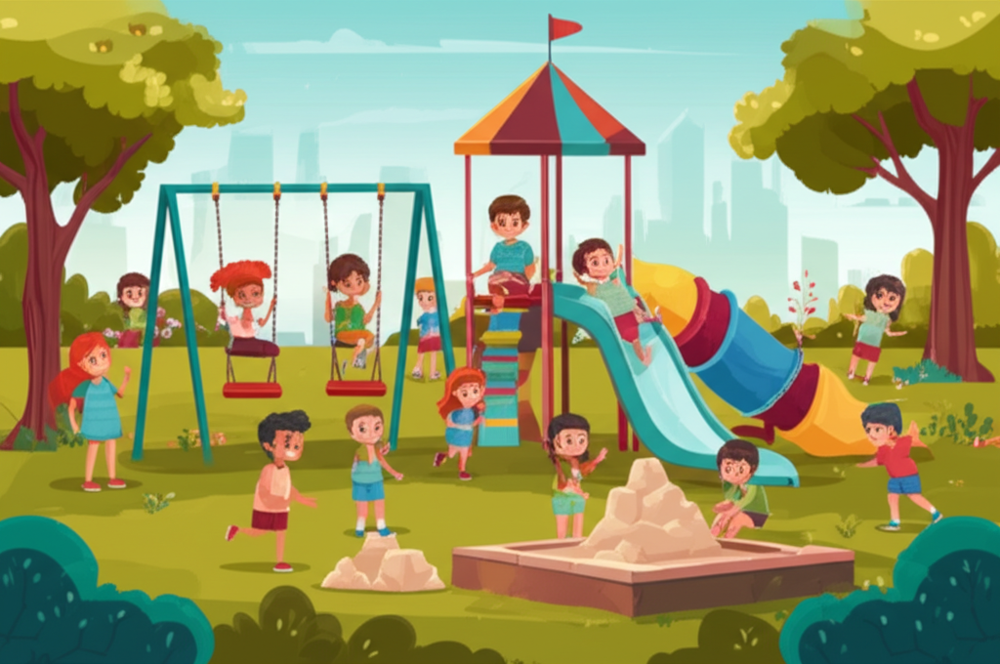

In [ ]:
data=response.candidates[0].content.parts[1].inline_data.data   #return image in binary formate 
#saving image into the storage so that we can see the generated images 
with open('playing childer.png','wb') as f:
    f.write(data)

from IPython.display import display
image =Image.open(BytesIO(data))
display(image)


In [39]:
#how to edit the images 
"""
here input is image and text 
and output is image 
"""

import PIL.Image

PIL.Image.open("playing childer.png")

response = client.models.generate_content(
    model='gemini-2.0-flash-preview-image-generation',
    contents=[image,'in the given image add seesaw '],
    config=types.GenerateContentConfig(response_modalities=['TEXT','IMAGE'])   
)


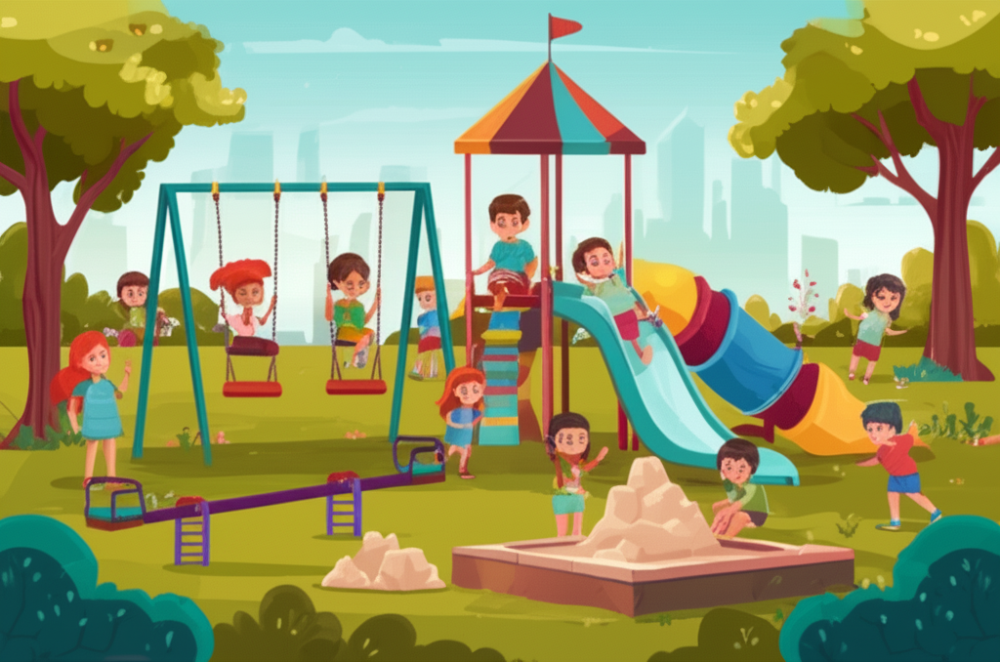

In [42]:
data=response.candidates[0].content.parts[0].inline_data.data   #return image in binary formate 
#saving image into the storage so that we can see the generated images 
with open('playing childer.png','wb') as f:
    f.write(data)

from IPython.display import display
image =Image.open(BytesIO(data))
display(image)


In [49]:

image = PIL.Image.open("blank_home.jpg")

client = genai.Client()

text_input = ("What other color and design sofas would work in my room update the image with the sofa design and colour")

response = client.models.generate_content(
    model="gemini-2.0-flash-preview-image-generation",
    contents=[text_input, image],
    config=types.GenerateContentConfig(
      response_modalities=['TEXT', 'IMAGE'],
      temperature=0.5
    )
)

response

GenerateContentResponse(
  automatic_function_calling_history=[],
  candidates=[
    Candidate(
      content=Content(
        parts=[
          Part(
            text="""I will generate an image of your room with a modern, low-profile sofa in a rich teal velvet. The sofa will have clean lines and simple, dark metal legs, providing a stylish contrast to the light walls and wooden floor.

"""
          ),
          Part(
            inline_data=Blob(
              data=<... Max depth ...>,
              mime_type=<... Max depth ...>
            )
          ),
        ],
        role='model'
      ),
      finish_reason=<FinishReason.STOP: 'STOP'>,
      index=0
    ),
  ],
  model_version='gemini-2.0-flash-preview-image-generation',
  response_id='4OTgaNL0NvGdosUPpKOpkAk',
  sdk_http_response=HttpResponse(
    headers=<dict len=11>
  ),
  usage_metadata=GenerateContentResponseUsageMetadata(
    candidates_token_count=1337,
    candidates_tokens_details=[
      ModalityTokenCount(
      

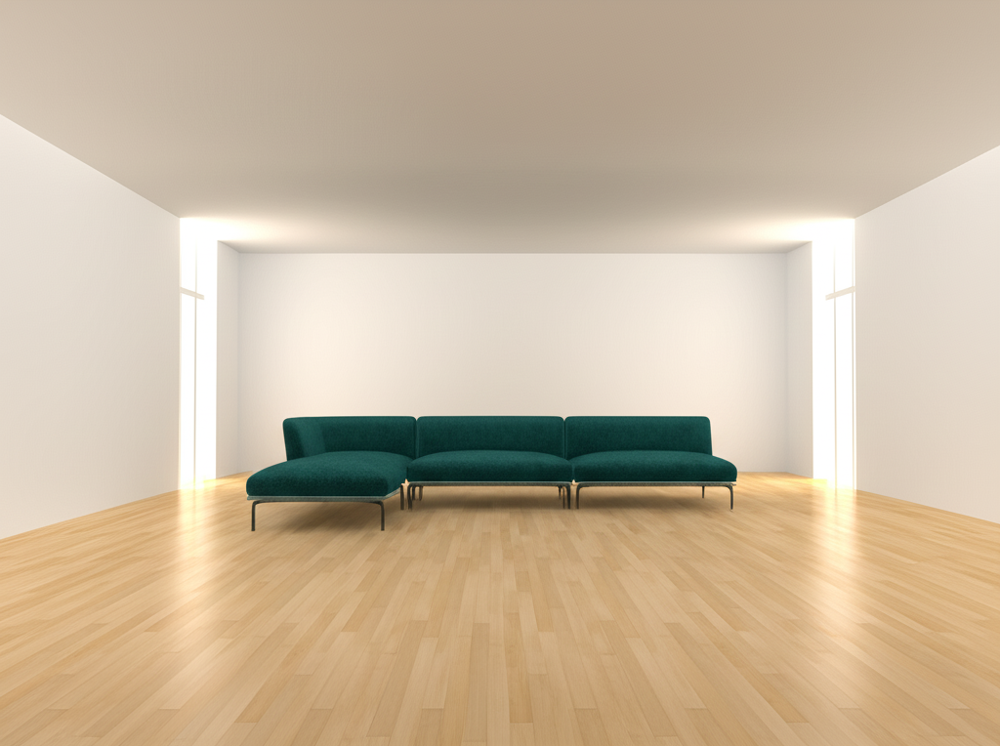

In [50]:
data = response.candidates[0].content.parts[1].inline_data.data

from IPython.display import display
image= Image.open(BytesIO(data))
display(image)

important note all params are not configurable with all models here we cant use max_token param .

In [60]:
#image editiing 

image = PIL.Image.open("blank_home.jpg")

client = genai.Client()

text_input = ("Write an on quote on front wall of the room such as more creative and looks like someone write quote with the help of paint:- everyday is a newday  ")

response = client.models.generate_content(
    model="gemini-2.0-flash-preview-image-generation",
    contents=[text_input, image],
    config=types.GenerateContentConfig(
      response_modalities=['TEXT', 'IMAGE'],
      temperature=0.5
    )
)

response

GenerateContentResponse(
  automatic_function_calling_history=[],
  candidates=[
    Candidate(
      content=Content(
        parts=[
          Part(
            inline_data=Blob(
              data=<... Max depth ...>,
              mime_type=<... Max depth ...>
            )
          ),
        ],
        role='model'
      ),
      finish_reason=<FinishReason.STOP: 'STOP'>,
      index=0
    ),
  ],
  model_version='gemini-2.0-flash-preview-image-generation',
  response_id='nebgaKvBLPbS1e8P6or68Ao',
  sdk_http_response=HttpResponse(
    headers=<dict len=11>
  ),
  usage_metadata=GenerateContentResponseUsageMetadata(
    candidates_token_count=1290,
    candidates_tokens_details=[
      ModalityTokenCount(
        modality=<MediaModality.IMAGE: 'IMAGE'>,
        token_count=1290
      ),
    ],
    prompt_token_count=291,
    prompt_tokens_details=[
      ModalityTokenCount(
        modality=<MediaModality.TEXT: 'TEXT'>,
        token_count=33
      ),
      ModalityTokenCount(
  

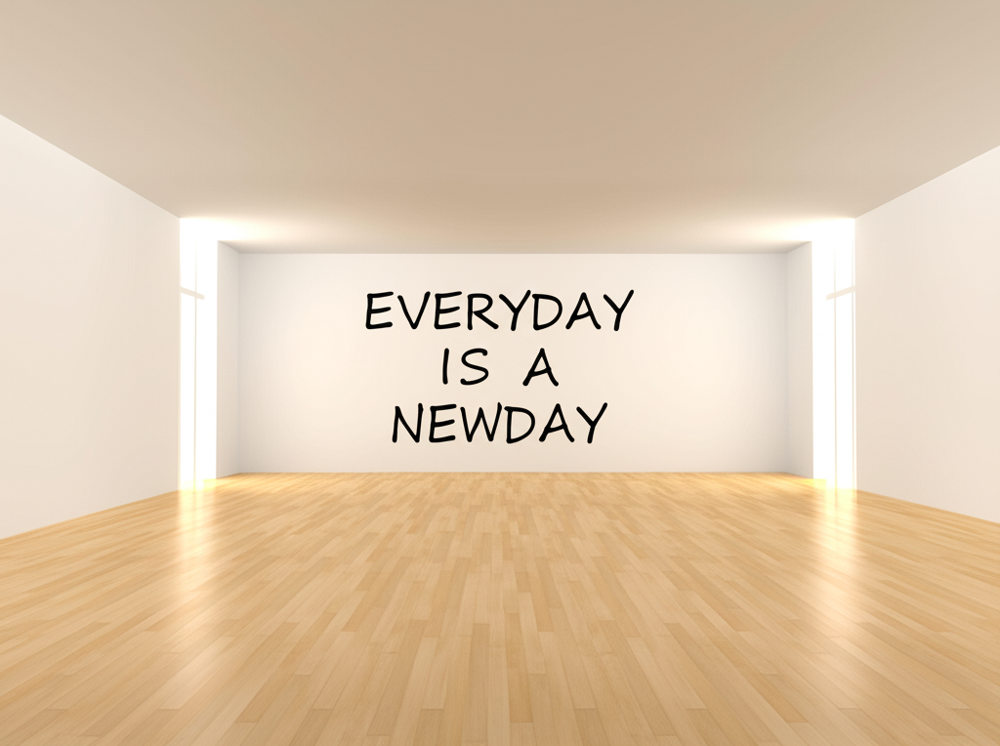

In [61]:
data = response.candidates[0].content.parts[0].inline_data.data

from IPython.display import display
image= Image.open(BytesIO(data))
display(image)

<!-- mediaResolution
enum (MediaResolution)
Optional. If specified, the media resolution specified will be used. -->

mediaResolution
enum (MediaResolution)
Optional. If specified, the media resolution specified will be used.

In [ ]:
# in summary if we want to generate image as an output so we just want to give the params in config and set modality param .env

**speech generation**

In [86]:
#text->speech
#modality ->audio 
#config--generatecontentconfig->SpeechConfig

#if we want to generate output in single voice then we use this params 
# congfig-- GenerateContentConfig -- SpeechConfig  -- voiceConfig -- prebuiltVoiceConfig -- voice_name
#here we use TTS model(text to speech models) 

response=client.models.generate_content(
    model='gemini-2.5-flash-preview-tts',
    contents=["say carefully: hey how are you ?"],
    config=types.GenerateContentConfig(
        response_modalities=['AUDIO'],
        speech_config=types.SpeechConfig(
            voice_config=types.VoiceConfig(
                prebuilt_voice_config=types.PrebuiltVoiceConfig(
                    voice_name='Kore'
                )
            )
        ),
    )
)

In [87]:
print(response)

sdk_http_response=HttpResponse(
  headers=<dict len=11>
) candidates=[Candidate(
  content=Content(
    parts=[
      Part(
        inline_data=Blob(
          data=b'\x00\x00\x00\x00\xe1\xff\xe1\xff\xe1\xff\x00\x00?\x00?\x00?\x00?\x00\x00\x00\x00\x00\xe1\xff\xe1\xff\xe1\xff\xe1\xff\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\xe1\xff\xc1\xff\xc1\xff\xc1\xff\xe1\xff\x00\x00\x00\x00?\x00?\x00?\x00\x00\x00\x00\x00\xe1\xff\xc1\xff\xc1\xff\xc1\xff\xe1\xff\xe1\xff\x00\x00\x00\x00\x00\x00?\x00?\x00?\x00\x00...',
          mime_type='audio/L16;codec=pcm;rate=24000'
        )
      ),
    ],
    role='model'
  ),
  finish_reason=<FinishReason.STOP: 'STOP'>,
  index=0
)] create_time=None model_version='gemini-2.5-flash-preview-tts' prompt_feedback=None response_id='x-_gaLqHBOz-1e8P68jvwQo' usage_metadata=GenerateContentResponseUsageMetadata(
  candidates_token_count=53,
  candidates_tokens_details=[
    ModalityTokenCount(
      modality=<MediaModality.AUDIO: 'AUDIO'>,
      

In [88]:
data=response.candidates[0].content.parts[0].inline_data.data

In [89]:
#so here we have to first convert binary file into human understandable 
#.wav
#chennal - 1.mono ,2.sterio 
# samplewidth -clearity 1-8bits ,2-16 bits
# framerate -  
import wave
def wave_file( file_name, input ):
    with wave.open(file_name,'wb') as wf:
        wf.setnchannels(1)
        wf.setsampwidth(2)
        wf.setframerate(24000)
        wf.writeframes(input)

In [90]:
file_name='out_python.wav'
wave_file(file_name,data)


In [91]:
from IPython.display import Audio
Audio('out_python.wav')

**multi tone speech output **


In [92]:
# MULTI TONE PARAGRAPH
response = client.models.generate_content(
    model="gemini-2.5-flash-preview-tts",
     contents=[
        "Say cheerfully: Good morning!",
        "Say excitedly: Today is a big day.",
        "Say angrly: Stay calm and give it your best.",
        "Say encouragingly: You're going to do great.",
        "Say Sadly: I wish I could also come."
    ],
    config=types.GenerateContentConfig(
      response_modalities=['AUDIO'],
      speech_config= types.SpeechConfig(
          voice_config= types.VoiceConfig(
              prebuilt_voice_config= types.PrebuiltVoiceConfig(
                  voice_name='Kore'
              )
          )
      ),
    )
)


In [93]:
data= response.candidates[0].content.parts[0].inline_data.data
file_name='Out.wav'
wave_file(file_name, data)

from IPython.display import Audio
Audio('Out.wav')

In [95]:
# muliple voice
prompt = """TTS the following conversation between Joe and Jane:
         Anya: Good morning, Liam. Based on the recent climate model, we might need to update our energy distribution strategy.
         Liam:Morning, Dr. Anya. I was reviewing the latest projections last night. It looks like solar output might drop by 20% in the northern grid.
         Anya:  Exactly. That could impact the balance in real-time supply-demand. Let’s consider rerouting some wind power reserves.
         Liam: NI’ll run the simulation and share the updated dashboard with the operations team. Should we also notify regional operators?
         """


In [96]:
# The TTS models only output audio, but you can use other models to generate a transcript first, then pass that transcript to the TTS model to read aloud.

# congfig-- GenerateContentConfig -- SpeechConfig  --multiSpeakerVoiceConfig --speakerVoiceConfigs(speaker)--
# --voiceConfig -- prebuiltVoiceConfig -- voice_name


response = client.models.generate_content(
   model="gemini-2.5-flash-preview-tts",contents=prompt,
   config=types.GenerateContentConfig( response_modalities=["AUDIO"],
      speech_config=types.SpeechConfig(
         multi_speaker_voice_config=types.MultiSpeakerVoiceConfig(
            speaker_voice_configs=[

               types.SpeakerVoiceConfig(
                  speaker='Anya',
                  voice_config=types.VoiceConfig(
                     prebuilt_voice_config=types.PrebuiltVoiceConfig(
                        voice_name='Kore',
                     )
                  )
               ),
               types.SpeakerVoiceConfig(
                  speaker='Liam',
                  voice_config=types.VoiceConfig(
                     prebuilt_voice_config=types.PrebuiltVoiceConfig(
                        voice_name='Puck',
                     )
                  )
               ),
            ]
         )
      )
   )
)


In [97]:
data= response.candidates[0].content.parts[0].inline_data.data
file_name='Out.wav'
wave_file(file_name, data)

from IPython.display import Audio
Audio('Out.wav')